In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm

In [2]:
sc.settings.set_figure_params(dpi=300,fontsize=15)

In [3]:
adata = sc.read_h5ad('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/Endothelial_datasets/data_analyzed/sanger_datasets/adult19_all_cells_raw_immune_20230615.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 758414 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'study', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'original_index', 'ann_vas_2', 'index_uni', 'leiden_scVI', 'ann_vas_1', 'ann_vas_3', 'ann_vas_3_copy', 'ann_vas_2_copy', 'organ_uni', 'ann_compartment'
    var: 'ENSG_id', 'gene_name_33538', 'gene_name_33694', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'gene_names_hg_v1.2-0-

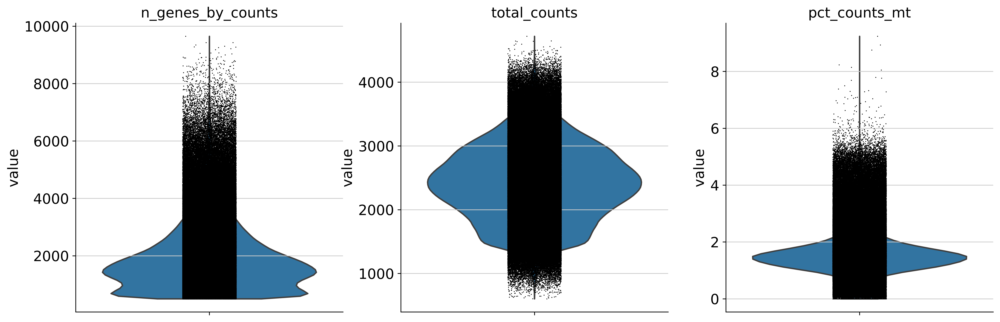

In [6]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.1, multi_panel=True)

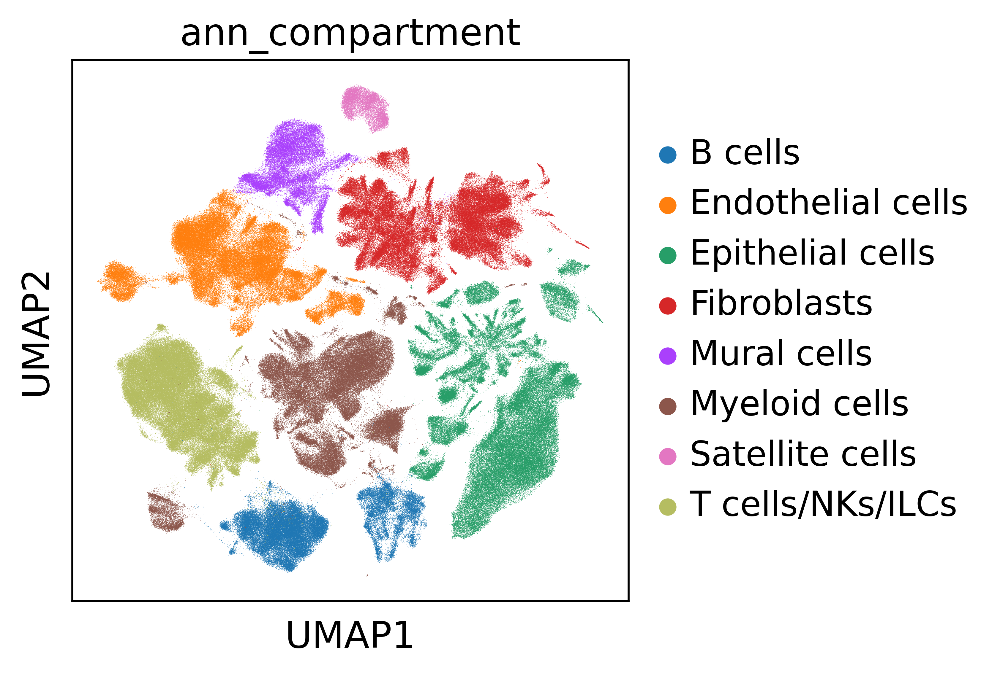

In [6]:
sc.pl.umap(adata, color = 'ann_compartment')

In [4]:
adata.obs.ann_compartment.value_counts()

T cells/NKs/ILCs     141572
Epithelial cells     140814
Myeloid cells        116716
Fibroblasts          115819
Endothelial cells    114489
B cells               77405
Mural cells           39136
Satellite cells       12463
Name: ann_compartment, dtype: int64

In [13]:
adata.obs['ann_compartment'].cat.reorder_categories(["Endothelial cells","Mural cells","Fibroblasts","Satellite cells","Epithelial cells","Myeloid cells","B cells","T cells/NKs/ILCs"],inplace=True)

/var/tmp/pbs.8349124.pbs/ipykernel_1677728/4008308947.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['ann_compartment'].cat.reorder_categories(["Endothelial cells","Mural cells","Fibroblasts","Satellite cells","Epithelial cells","Myeloid cells","B cells","T cells/NKs/ILCs"],inplace=True)


In [25]:
compartment_markers = {
    'EC': ["PECAM1","CDH5","VWF"],
    'Mural': ["ACTA2","MYH11","RGS5"],
    'Fibroblasts': ["DCN","PDGFRA","SCARA5"],
    'Satellite': ["PAX7","MYF6","MYF5"],
    'Epithelial': ["EPCAM","CDH1","CLDN7"],
    'Myeloid': ["MRC1","MARCO","MSR1"],
    'B': ["MS4A1","CD79A","CD19"],
    'T/NK/ILC': ["KLRB1","NKG7","CD3E"],
}

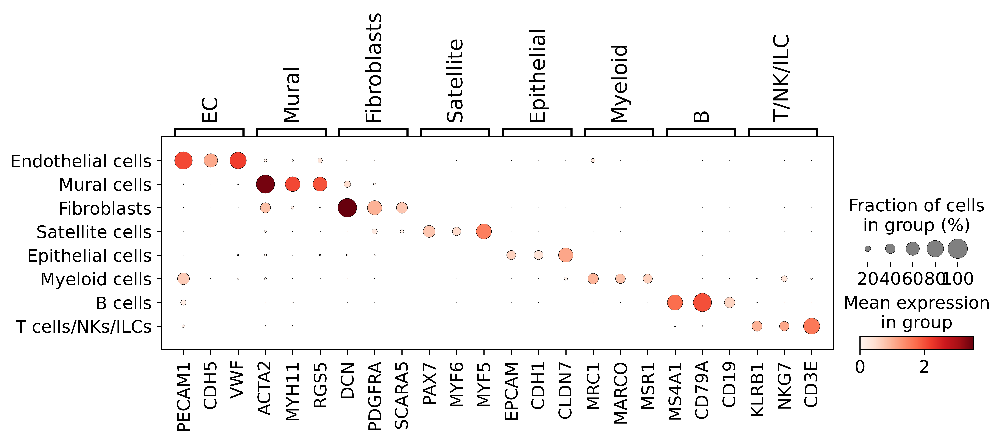

In [26]:
sc.pl.dotplot(adata, compartment_markers, "ann_compartment")

In [4]:
adata.obs["sex"] = adata.obs["gender"]

In [5]:
adata

AnnData object with n_obs × n_vars = 758414 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'study', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'original_index', 'ann_vas_2', 'index_uni', 'leiden_scVI', 'ann_vas_1', 'ann_vas_3', 'ann_vas_3_copy', 'ann_vas_2_copy', 'organ_uni', 'ann_compartment', 'sex'
    var: 'ENSG_id', 'gene_name_33538', 'gene_name_33694', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'gene_names_hg_

In [11]:
adata.obs.donor.value_counts()

TSP14     96990
TSP2      67411
A34       42108
A59       33979
A13       32155
          ...  
Wilms2      373
TxK3        271
RCC3        257
A47         202
621B        104
Name: donor, Length: 62, dtype: int64

In [ ]:
sc.pl.umap(adata, color = ["donor"], ncols = 1)

In [ ]:
sc.pl.umap(adata, color = ["kit"],ncols = 1)

In [ ]:
sc.pl.umap(adata, color = ["pct_counts_mt"], ncols = 1)

In [ ]:
sc.pl.umap(adata, color = ["pct_counts_rb"], ncols = 1)

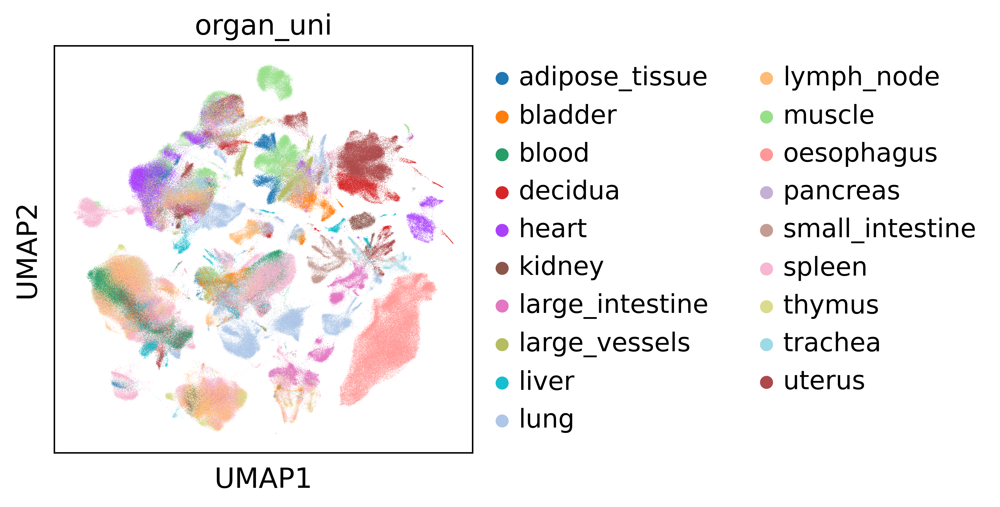

In [21]:
sc.pl.umap(adata, color = ["organ_uni"], ncols = 1)